# Final Project

### Table of Contents:

1. Materials & Methods
2. Business Understanding
3. Data Understanding 
    * 3.1 Features Information
    * 3.2 Importing Data
    * 3.3 Preliminary Data Checking
    * 3.4 Exploratory Data Analysis (EDA)
        * 3.4.1 Data Distribution Visualization
        * 3.4.2 Visualization With The Target Label
        * 3.4.3 EDA Conclusion
4. References

## 1. Materials & Methods

The dataset of this project is taken from Kaggle. Originally, the data was collected from a Portuguese retail bank. 

This project focuses on targeting potential customers through telemarketing phone calls to sell term deposits. Thus, the outcome of the machine learning model is a binary, successful, or unsuccessful contact. The dataset (target variable) is considered as balanced, with 5289 (47.4%) records are related to successes and 5873 (52.6%) records are otherwise. In addition, the features of the dataset include the bank's potential clients' information and some information regarding the last contact of the previous and current campaign.


In this project, I try to implement the CRISP-DM methodology. CRISP-DM stands for cross-industry process for data mining. The CRISP-DM method provides a structured approach to do a data science project. The phases of the CRISP-DM method comprise of:

    1. Business understanding
    2. Data understanding   
    3. Data preparation
    4. Modeling
    5. Evaluation
    6. Deployment

## 2. Business Understanding

Marketing campaigns are a typical strategy to enhance business. In other words, marketing campaigns are so-called the lifeblood of revenue for many companies, including the banking sector. Most importantly, revenue can be generated predictably through the marketing campaign. For the banking industry, companies usually use direct marketing when targeting segments of customers by contacting them through a phone call (telemarketing) to meet an intended goal.

The fast technology development enables marketing by focusing on maximizing customer lifetime value by evaluating available information and customer metrics. Thus, it is allowing companies to build longer relations in alignment with business demand. Machine learning can be a support system of the marketing campaign workflow nowadays. It can generate efficient and better decision results without risking the predictable nature of existing campaigns. Thus, a machine learning model can be used to support managerial decision-making. However, machine learning models also have their drawbacks, particularly issues with trust relative to what is being predicted, why and what data is being used by the algorithms, and what the model is doing for the business. 

 
### Business problems

A term deposit is a deposit that a bank offers with a fixed rate in which the customer's money will be returned later at a specific time. In this project, I play a role as a data scientist whose client is a Portuguese bank that needs to increase its capital requirements (the amount of capital a bank has to have as required by its financial regulator) by gaining the number of customers subscribing to their term deposits. However, to achieve the goal, the bank needs to define their potential customers' characteristics who most likely will subscribe to a term deposit.

Several aspects need to be covered in formulating the machine learning model, such as:

1. Business problem: The company's management needs to gain revenue by increasing the number of term deposit subscribers. One of the ways to achieve the goal is to enhance the effectiveness of marketing campaigns. To quickly make decisions based on big data, the marketing department needs to have a machine learning model to help them identify more potential customers and reduce the marketing cost simultaneously. Ultimately, the marketing effectiveness will improve.

2. Data for model: Dataset that contains potential customers' and campaign-related information.

3. ML model objective: A predictive model that can predict whether potential customers will subscribe or not to a term deposit.

In accordance with the business problem, this project aims to make a model that can automatically predict the result of a phone call to sell a term deposit. Such a model helps the marketing manager in prioritizing and selecting the potential clients to be contacted during bank marketing campaigns. As a result, the time and costs of such campaigns would be more efficient. Besides, performing fewer yet more effective phone calls will reduce client stress and intrusiveness (Moro et al., 2014).

## 3. Data Understanding

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same potential client was required, in order to access if the product (bank term deposit) would be or not subscribed.

### 3.1 Features Information

Bank client data

0. age: Age in years (numeric)
1. job: Type of job (categorical: ['admin', 'technician', 'services', 'management', 'retired', 'blue-collar', 'unemployed', 'entrepreneur', 'housemaid', 'unknown', 'self-employed', 'student'])
2. marital: Marital status (categorical: ['married', 'single', 'divorced'])
3. education: Education background (categorical: ['secondary', 'tertiary', 'primary', 'unknown'])
4. default: Has credit in default? (categorical: ['no', 'yes'])
5. balance: Balance of the individual
6. housing: Has housing loan? (categorical: ['yes', 'no'])
7. loan: Has personal loan? (categorical: ['no', 'yes'])

Related with the last contact of the current campaign

8. contact: Contact communication type (categorical: ['unknown', 'cellular', 'telephone'])
9. day: Last contact day of the week (categorical: ['mon', 'tue', 'wed', 'thu', 'fri'])
10. month: Last contact month of year (categorical: ['may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec', 'jan', 'feb', 'mar', 'apr'])
11. duration: Last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
12. campaign: Number of contacts performed during this campaign and for this client (numeric)

Related with the contact of the previous campaign

13. pdays: Number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14. previous: Number of contacts performed before this campaign and for this client (numeric)
15. poutcome: Outcome of the previous marketing campaign (categorical: ['unknown', 'other', 'failure', 'success'])

Label (output variable)

16. deposit: Has the client subscribed a term deposit? (binary: ['yes', 'no'])

### 3.2 Importing Data

Import Libraries

In [1]:
# Import basic libraries
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

Load Dataset

In [2]:
# Load dataset
bank = pd.read_csv('bank.csv')
bank

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,33,blue-collar,single,primary,no,1,yes,no,cellular,20,apr,257,1,-1,0,unknown,no
11158,39,services,married,secondary,no,733,no,no,unknown,16,jun,83,4,-1,0,unknown,no
11159,32,technician,single,secondary,no,29,no,no,cellular,19,aug,156,2,-1,0,unknown,no
11160,43,technician,married,secondary,no,0,no,yes,cellular,8,may,9,2,172,5,failure,no


### 3.3 Preliminary Data Checking

1. Find unwanted columns
2. Find missing values and feature with only one value

#### 1. Find unwanted columns

In [3]:
# Check dataset information
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


According to the features information, there are no unwanted columns in this dataset. Thus, all these columns will be used until the step of feature selection.

#### 2. Find missing values & feature with only one value

In [4]:
# Create a dataframe to extract the wanted information
pd.DataFrame({'Feature': bank.columns, 'DataType': bank.dtypes,
             'Total Null Value': bank.isna().sum(), 'Unique': bank.nunique(),
             'Unique Value Sample': [list(bank[i].drop_duplicates().sample()) for i in bank.columns]}).reset_index(drop=True)

,Feature,DataType,Total Null Value,Unique,Unique Value Sample
0,age,int64,0,76,[62]
1,job,object,0,12,[blue-collar]
2,marital,object,0,3,[divorced]
3,education,object,0,4,[tertiary]
4,default,object,0,2,[yes]
5,balance,int64,0,3805,[-131]
6,housing,object,0,2,[yes]
7,loan,object,0,2,[yes]
8,contact,object,0,3,[cellular]
9,day,int64,0,31,[29]


No missing value and feature with only one value found in the dataset.

### 3.4 Exploratory Data Analysis (EDA)

In [5]:
# Check numerical features description
bank.describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


According to the description of numerical features:

1. The mean of age of potential clients is about 41 years old, with the youngest is 18 years old and the oldest is 95 years old.

2. The mean of balance is 1528. Nevertheless, the standard deviation value is quite high (twofold the mean value). It can be said that the balance is widely distributed in this dataset (later, it also can be seen from the visualization).

3. The duration feature has a minimum value of 2.00. It means that all the target customers in this dataset have received the call from the telemarketer for this campaign.

4. The pdays feature holds the number of days that passed by after the potential customer was last contacted from a previous campaign. It is weird that the minimum value of this feature is -1. Thus, it is quite interesting to analyze this feature further. In addition, there is no value of 999 in this feature. For now, it is assumed that all the potential clients have ever been contacted from the previous campaign.

In [6]:
# Define numerical features
numerical_features = [feature for feature in bank.columns if ((bank[feature].dtypes != 'O'))]
numerical_features

['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

In [7]:
# Define categorical features
categorical_features = [feature for feature in bank.columns if ((bank[feature].dtypes == 'O') & (feature not in ['deposit']))]
categorical_features

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome']

In [8]:
# Explore categorical features to see how many category in each features
bank.describe(include=['O']) 

,job,marital,education,default,housing,loan,contact,month,poutcome,deposit
count,11162,11162,11162,11162,11162,11162,11162,11162,11162,11162
unique,12,3,4,2,2,2,3,12,4,2
top,management,married,secondary,no,no,no,cellular,may,unknown,no
freq,2566,6351,5476,10994,5881,9702,8042,2824,8326,5873


* There are 9 categorical features, excluding the deposit feature (target).
* Feature job and month have the highest unique value of categorical features.

### 3.4.1 Data Distribution Visualization

#### The data distribution of numerical features

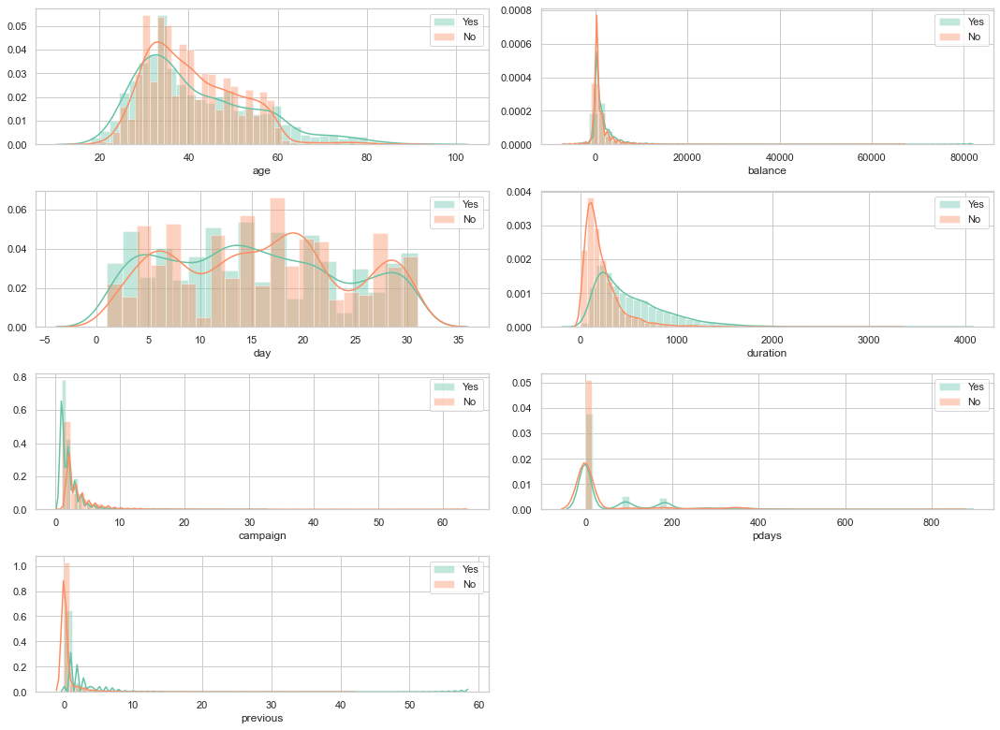

In [9]:
# Plot of data distribution of numerical features
plt.figure(figsize=(15, 11))
sns.set(style='whitegrid', palette='Set2')

numerical_codes = {}

for i in range(len(numerical_features)):
    numerical_codes[numerical_features[i]] = i

for features, i in numerical_codes.items():
    plt.subplot(4, 2, i+1)
    sns.distplot(bank.loc[bank['deposit'] == 'yes', features], label = 'Yes')
    sns.distplot(bank.loc[bank['deposit'] == 'no', features], label = 'No')
    plt.legend()

plt.tight_layout();

In [10]:
# Perform normality test for numerical features to check data distribution
from scipy import stats

num = 0

for i in numerical_features:
    k2, p = stats.normaltest(bank[i])
    alpha = 0.05
    
    num += 1
    print(f'{num}. p-value {i} = {p}')
    
    if p < alpha:
        print('The null hypothesis can be rejected')
        print()
    else:
        print('The null hypothesis cannot be rejected')
        print()

1. p-value age = 8.149004904134128e-253
The null hypothesis can be rejected

2. p-value balance = 0.0
The null hypothesis can be rejected

3. p-value day = 0.0
The null hypothesis can be rejected

4. p-value duration = 0.0
The null hypothesis can be rejected

5. p-value campaign = 0.0
The null hypothesis can be rejected

6. p-value pdays = 0.0
The null hypothesis can be rejected

7. p-value previous = 0.0
The null hypothesis can be rejected



Key takeaways:

1. According to the normality test for each numerical feature, all the features data is not normally distributed. 

2. It can be seen from the plot that 'balance', 'duration', 'pdays', 'campaign', and 'previous' features are heavily skewed towards the left. Based on plausibility and domain knowledge, 'pdays', 'campaign', and 'previous' seem to have some outliers.

3. The acceptance and refusal of a subscription offer mostly come from the customers in the age of 30s. 

4. The difference between yes and no in the 'duration' feature is obvious. The longer the duration, the more likely potential customers will subscribe to term deposits.

5. Regarding the potential outliers in 3 features mentioned above, the possible scenarios are following:

- pdays: Contacting a lead after more than 800 days is unusual but still plausible. For instance, maybe the potential customer has already been removed from the marketing list, but later the person is likely will open an account and therefore be put back on the marketing list. Although the potential customer was removed and added back, it is also possible that the bank marketing system never stopped counting the days in between.

- campaign: Being contacted 30 times or even over for one marketing campaign is a bit odd. Why did the marketing team need to reach out to a person so many times? Don't the marketers think the potential customer is probably not interested? In addition, most companies are most likely will not waste time and money like that. Thus, this issue needs more in-depth investigation.

- previous: The potential outliers data (up to over 50 times) in this feature is plausible if a potential customer was listed in several campaigns.

#### The data distribution of categorical features

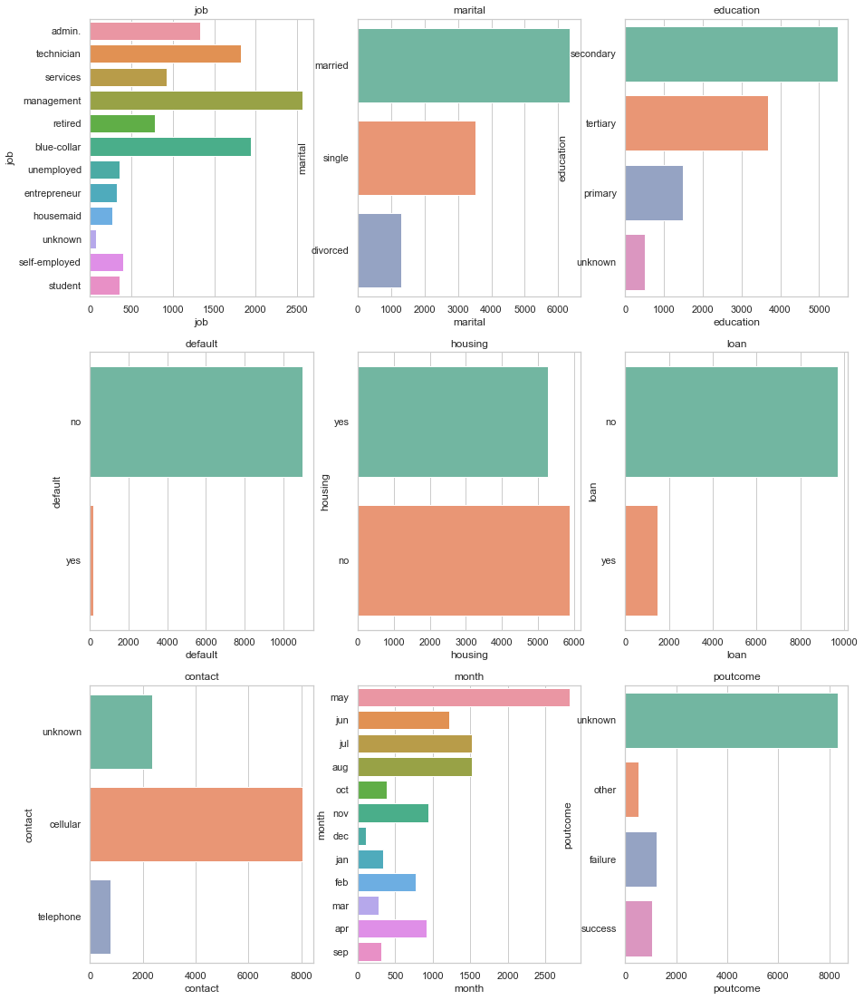

In [11]:
# Check total count for each category on categorical features
plt.figure(figsize=(15, 80), facecolor='white')
sns.set(style='whitegrid', palette='Set2')
plotnumber = 1

for categorical_feature in categorical_features:
    ax = plt.subplot(12, 3, plotnumber)
    sns.countplot(y = categorical_feature, data = bank)
    plt.xlabel(categorical_feature)
    plt.title(categorical_feature)
    plotnumber += 1
plt.show()

Key takeaways:

1. Blue-collar, management and technicians constitute about 60% percent of the population.

2. Married is the most dominant marital feature status, up to more than 6000 potential customers.

3. Most of the potential customers have a secondary education background.

4. The discrepancy between yes and no in the default feature is so obvious. Most of the potential customers have no credit default. Though the default is one of the most important variables for analyzing credit customers, it looks like it has no relation to deposit in this dataset.

5. The number of potential customers who do not have a loan and a housing loan is higher than those who have.

6. Contact through mobile is the most dominant. It is interesting to see that the unknown way is a lot more than the telephone. The unknown way maybe can be through a direct meeting.

7. The highest marketing activity was achieved in May. By contrast, December had such a small number of marketing activities.

8. The outcome of the previous campaigns is mostly unknown. However, regardless of the unknown and other results in the poutcome feature, all the listed potential customers in the dataset have got previous campaigns (according to the pdays feature).

#### Numerical features correlation against the target label

In [12]:
# Create a new label (numeric) for deposit feature
bank['label_deposit'] = bank['deposit'].apply(lambda x: 1 if x == 'yes' else 0)

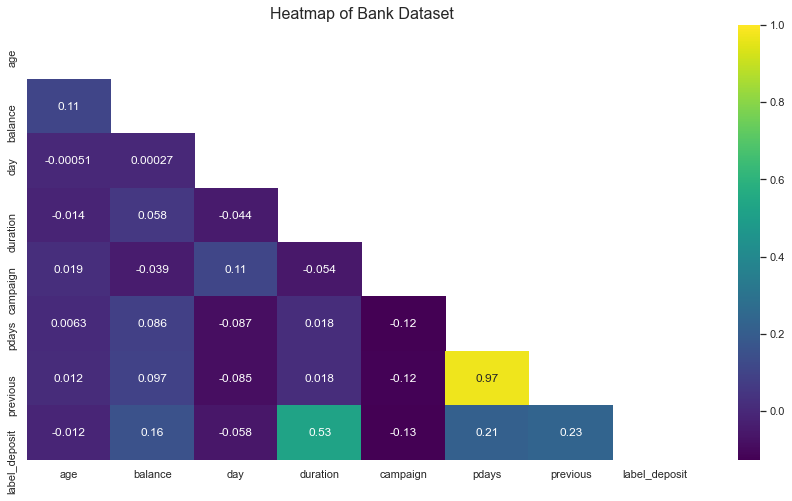

In [13]:
# Plot a heatmap to see correlation among numerical features
mask = np.zeros_like(bank.corr()) 
mask[np.triu_indices_from(mask)]=True

plt.figure(figsize=(15, 8))
plt.title('Heatmap of Bank Dataset', size=16)
sns.heatmap(bank.corr(method='spearman'), cmap='viridis', annot=True, mask=mask, vmax=1);

I use the coefficient correlation interpretation as follows (see references [4]):

Coefficient Interval  |  Correlation
  
    0.00 - 0.199         Very Weak
    0.20 - 0.399         Weak
    0.40 - 0.599         Medium
    0.60 - 0.799         Strong
    0.80 - 1.000         Very Strong
___

'age' and 'day' features have very weak negative correlation with deposit. Interestingly, only the 'duration' feature that has moderate positive correlation with deposit (0.53). 

It means that the longer the duration, the bigger chance to get a new subscriber of term deposit. The rest of features have weak and very weak correlation.

### 3.4.2 Visualization With The Target Label

To perform further analysis and for plotting reason, some of the categorical features will be converted into numeric.

In [14]:
# Create a copy of dataset for EDA purposes
df = bank.copy()

In [15]:
# Converting the binary columns
def converting(df, new_col, target_col):
    df[new_col] = df[target_col].apply(lambda x: 1 if x == 'yes' else 0)
    return df[new_col].value_counts()

In [16]:
# Replace the binary string columns with integer type columns
converting(df, 'default_num', 'default')
converting(df, 'housing_num', 'housing')
converting(df, 'loan_num', 'loan')
converting(df, 'deposit_num', 'deposit') 

0    5873
1    5289
Name: deposit_num, dtype: int64

In [17]:
# For EDA purposes, the unused binary string column will be dropped and be replaced by the same but integer type
df.drop(['default'], axis=1, inplace=True) 

In [18]:
# Create a column with the numeric values of the months
month_list = [df]

for column in month_list:
    column.loc[column['month'] == 'jan', 'month_num'] = 1
    column.loc[column['month'] == 'feb', 'month_num'] = 2
    column.loc[column['month'] == 'mar', 'month_num'] = 3
    column.loc[column['month'] == 'apr', 'month_num'] = 4
    column.loc[column['month'] == 'may', 'month_num'] = 5
    column.loc[column['month'] == 'jun', 'month_num'] = 6
    column.loc[column['month'] == 'jul', 'month_num'] = 7
    column.loc[column['month'] == 'aug', 'month_num'] = 8
    column.loc[column['month'] == 'sep', 'month_num'] = 9
    column.loc[column['month'] == 'oct', 'month_num'] = 10
    column.loc[column['month'] == 'nov', 'month_num'] = 11
    column.loc[column['month'] == 'dec', 'month_num'] = 12

In [19]:
# Change month_num datatype from float64 to int64
df['month_num'] = df['month_num'].astype(np.int64)

In [20]:
# Converting duration from second to minute for easier interpretation
df['duration'] = df['duration']/60
df['duration'] = df['duration'].apply(lambda x: round(x, 2))

In [21]:
# Check current dataframe
df.head()

,age,job,marital,education,balance,housing,loan,contact,day,month,...,pdays,previous,poutcome,deposit,label_deposit,default_num,housing_num,loan_num,deposit_num,month_num
0,59,admin.,married,secondary,2343,yes,no,unknown,5,may,...,-1,0,unknown,yes,1,0,1,0,1,5
1,56,admin.,married,secondary,45,no,no,unknown,5,may,...,-1,0,unknown,yes,1,0,0,0,1,5
2,41,technician,married,secondary,1270,yes,no,unknown,5,may,...,-1,0,unknown,yes,1,0,1,0,1,5
3,55,services,married,secondary,2476,yes,no,unknown,5,may,...,-1,0,unknown,yes,1,0,1,0,1,5
4,54,admin.,married,tertiary,184,no,no,unknown,5,may,...,-1,0,unknown,yes,1,0,0,0,1,5


Further analysis of feature by feature

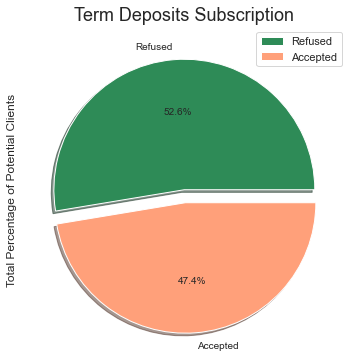

In [22]:
# Create pie chart of deposit feature
plt.figure(figsize=(10, 6))
colors=['seagreen', 'lightsalmon']
df['deposit_num'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', shadow=True, colors=colors, labels= ['Refused', 'Accepted'], fontsize=10)
plt.legend(loc='best')
plt.title('Term Deposits Subscription', fontsize=18)
plt.ylabel('Total Percentage of Potential Clients');

From the total of 11162 potential customers, 52.6 % (5873) of the population was refused to subscribe to term deposit. According to the pie chart above, a question raised, what factors that influence potential clients to either accept or refuse term deposit subscription?

Looking into some features that might be the factors of potential customer's decision

## Age

Since the range of age is quite wide from 18 to 95, it is better to group the ages into several ranges:

1. 20: Ages ranging from 18-29
2. 30: Ages ranging from 30-39
3. 40: Ages ranging from 40-49
4. 50: Ages ranging from 50-59
5. 60: Ages ranging from 60-95

In [23]:
# Create age_group column to categorize the range of age
age_list = [df]

for age in age_list:
    age.loc[age['age'] < 30,  'age_group'] = 20
    age.loc[(age['age'] >= 30) & (age['age'] <= 39), 'age_group'] = 30
    age.loc[(age['age'] >= 40) & (age['age'] <= 49), 'age_group'] = 40
    age.loc[(age['age'] >= 50) & (age['age'] <= 59), 'age_group'] = 50
    age.loc[age['age'] >= 60, 'age_group'] = 60

In [24]:
# Change age_group type from float 64 to int64
df['age_group'] = df['age_group'].astype(np.int64)

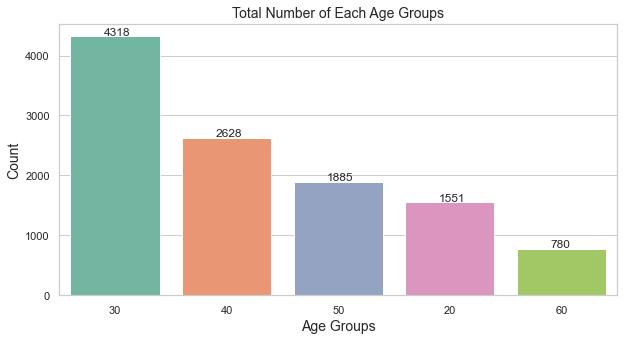

In [25]:
# Plot total number of each age group in descending order
plt.figure(figsize=(10, 5))
ax = sns.countplot(df['age_group'], order = df['age_group'].value_counts().index, palette='Set2')
plt.title('Total Number of Each Age Groups', fontsize=14)
plt.xlabel('Age Groups', size=14)
plt.ylabel('Count', size=14)

for p, label in zip(ax.patches, df['age_group'].value_counts()):
    ax.annotate(label, (p.get_x()+0.30, p.get_height()+25));

In [26]:
# Percentage of each age group to subscribe to a term deposit
pd.crosstab(df['deposit'], df['age_group']).apply(lambda x: x/x.sum()*100)

age_group,20,30,40,50,60
deposit,,,,,
no,40.167634,55.697082,59.550989,58.355438,23.076923
yes,59.832366,44.302918,40.449011,41.644562,76.923077


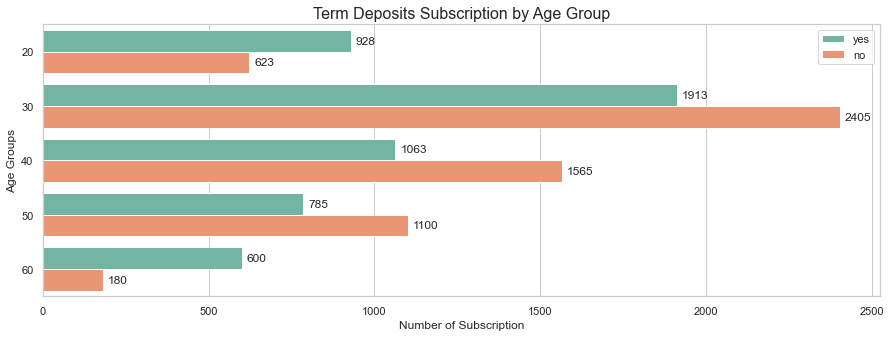

In [27]:
# Create a plot for deposits subscription by age group
plt.figure(figsize=(15, 5))
ax = sns.countplot(y='age_group', data=df, hue='deposit', palette='Set2') 
plt.title('Term Deposits Subscription by Age Group', fontsize=16)
plt.ylabel('Age Groups', fontsize=12)
plt.xlabel('Number of Subscription', fontsize=12)
plt.legend()

for i in ax.patches:
    ax.annotate(i.get_width(), xy=(i.get_width(), i.get_y()+i.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha='left', va='center');

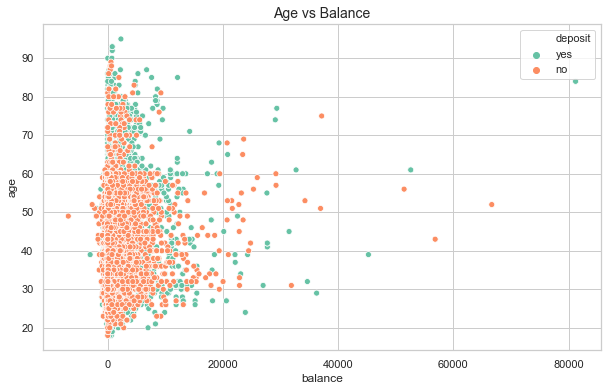

In [28]:
# Is there any pattern that can be found between age and balance?
plt.figure(figsize=(10, 6))
sns.scatterplot(x='balance', y='age', hue='deposit', data=df)
plt.title('Age vs Balance', size=14);

Key takeaways:

1. Most of the potential clients the bank targeted are in the age of 30s.

2. There is no clear pattern between age and balance. The plot shows that potential customers who have a balance of more than 20000 are in the range of age of mid 25 to about 80. Nevertheless, the more the customer's balance is, does not guarantee that the customer will subscribe to a term deposit.  

3. The percentage of each age group that subscribed to term deposit as follows:
    - Group of 20: Around 60% 
    - Groups of 30-50: About 40%
    - Group of 60: 76%

4. From the data above, it can be said that the youngest and eldest population segments were the most likely to subscribe to a term deposit.

## Job

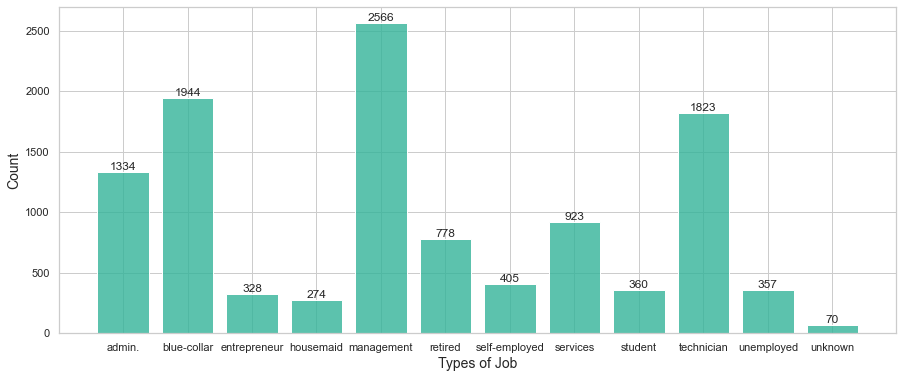

In [29]:
# Plot of total number of each job type
x = sorted(df['job'].unique())
y = df['job'].value_counts().sort_index()
colors = (0.2, 0.7, 0.6, 0.8)

plt.figure(figsize=(15, 6))
plt.bar(x, y, color=colors) 
plt.xlabel('Types of Job', size=14)
plt.ylabel('Count', size=14)

for i in range(len(y)):
    plt.annotate(str(y[i]), xy=(x[i], y[i]), ha='center', va='bottom')

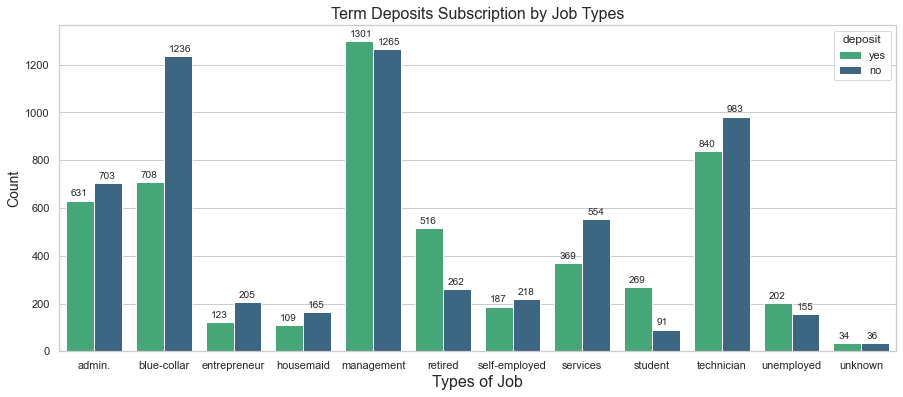

In [30]:
# Plot term deposit subscription by job types
plt.figure(figsize = (15, 6))
ax = sns.countplot(x='job', data=df, hue='deposit', palette='viridis_r',
        order=('admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'retired',
                'self-employed', 'services', 'student', 'technician', 'unemployed', 'unknown'))        
plt.xlabel('Types of Job', fontsize=16)
plt.ylabel('Count', size=14)
plt.title('Term Deposits Subscription by Job Types', size=16)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.07
    ypos = fit.get_height()+18
    ax.annotate(pct, (xpos, ypos), fontsize = 10);

Key takeaways:

1. People whose job types are management, blue-collar, and technician received the most offers to subscribe to a term deposit from the telemarketer. Those three groups take about 57% of the population. By contrast, housemaids and unknown types of jobs received the least amount of offers.

2. Interestingly, the highest ratio of potential customers that subscribed to a term deposit was achieved by job types of management, retired, student, and unemployed.

3. Approximately 75% of the students subscribed to a term deposit. On the other hand, about 66% of retired people are also subscribed. These findings are expected since the youngest segment of the population is most likely to be a student, and the eldest is supposed to be retired. 

## Balance

Balance has a positive correlation with the potential clients decision regarding term deposits subscription, eventhough very weak. Based on data information, the balance feature has a wide range value, from -6847 to 81204, with mean 1528.5. Hence, to make these values simplier, it is better to split the values into several groups:

1. No balance: Potential clients with negative balance and have no balance (0)
2. Low balance: Potential clients who have a balance greater than 0 but lower than 1000
3. Average balance: Potential clients who have a balance greater than 1000 buat lower than 5000
4. High balance: Potential clients who have a balance more than 5000

In [31]:
# Check 'balance' feature description
df.describe()['balance']

count    11162.000000
mean      1528.538524
std       3225.413326
min      -6847.000000
25%        122.000000
50%        550.000000
75%       1708.000000
max      81204.000000
Name: balance, dtype: float64

In [32]:
# Create a balance group column
df['balance_group'] = np.nan
balance_list = [df]

for balance in balance_list:
    balance.loc[balance['balance'] <= 0, 'balance_group'] = 'no balance'
    balance.loc[(balance['balance'] > 0) & (balance['balance'] <= 1000), 'balance_group'] = 'low balance'
    balance.loc[(balance['balance'] > 1000) & (balance['balance'] <= 5000), 'balance_group'] = 'average balance'
    balance.loc[balance['balance'] > 5000, 'balance_group'] = 'high balance'

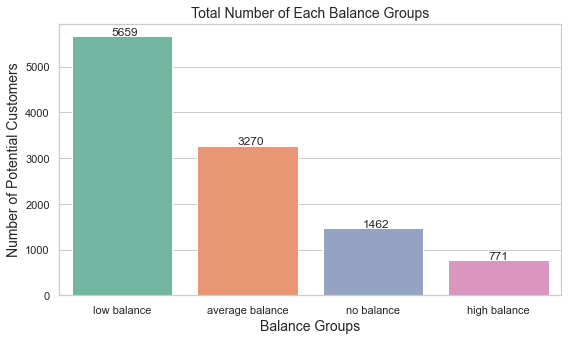

In [33]:
# Plot total number of each balance group in descending order
plt.figure(figsize=(9, 5))
ax = sns.countplot(df['balance_group'], order = df['balance_group'].value_counts().index, palette='Set2')
plt.title('Total Number of Each Balance Groups', fontsize=14)
plt.xlabel('Balance Groups', size=14)
plt.ylabel('Number of Potential Customers', size=14)

for p, label in zip(ax.patches, df['balance_group'].value_counts()):
    ax.annotate(label, (p.get_x()+0.32, p.get_height()+25));

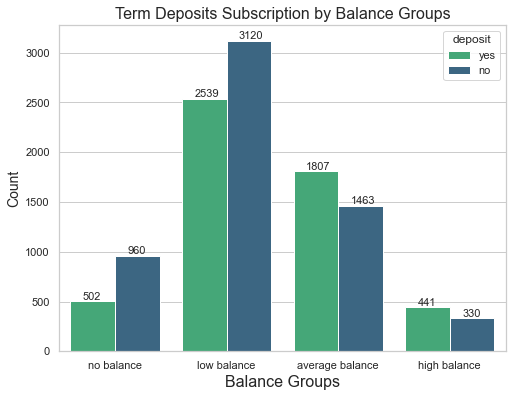

In [34]:
# Plot term deposits subscription by balance groups
plt.figure(figsize = (8, 6))
ax = sns.countplot(x='balance_group', data=df, hue='deposit', palette='viridis_r', 
        order=('no balance', 'low balance', 'average balance', 'high balance'))        
plt.xlabel('Balance Groups', fontsize=16)
plt.ylabel('Count', size=14)
plt.title('Term Deposits Subscription by Balance Groups', size=16)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.11
    ypos = fit.get_height()+18
    ax.annotate(pct, (xpos, ypos), fontsize = 11);

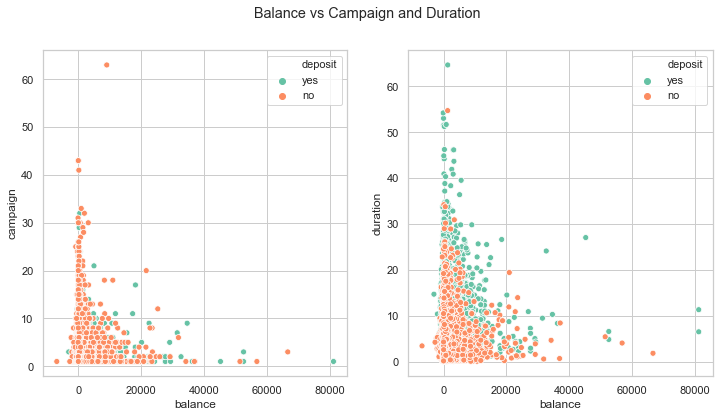

In [35]:
# Plot balance vs campaign and duration
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

fig.suptitle('Balance vs Campaign and Duration')
sns.set(style='whitegrid', palette='Set2')
sns.scatterplot(ax=axes[0], data=df, x='balance', y='campaign', hue='deposit')
sns.scatterplot(ax=axes[1], data=df, x='balance', y='duration', hue='deposit');

Is there any pattern can be found between balance groups and age groups?

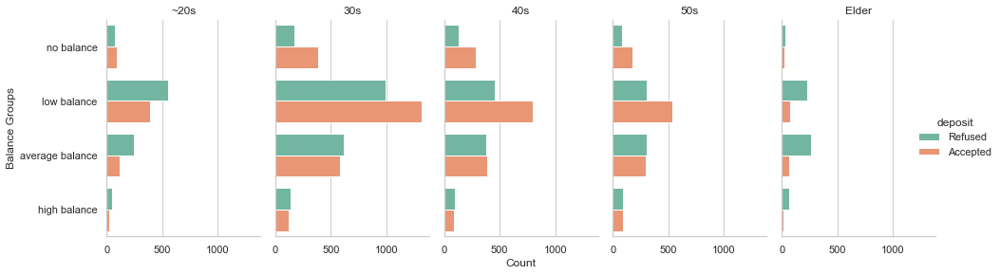

In [36]:
# Plot balance group vs age group
plotting = sns.factorplot(y='balance_group', hue='deposit', col='age_group', data=df, kind='count',
                   size=4, aspect=.7, palette='Set2', order=('no balance', 'low balance', 'average balance', 'high balance'))

plotting.axes[0,0].set_xlabel('')
plotting.axes[0,1].set_xlabel('')
plotting.axes[0,2].set_xlabel('Count')
plotting.axes[0,3].set_xlabel('')
plotting.axes[0,4].set_xlabel('')

# Set title
plotting.axes[0,0].set_title('~20s')
plotting.axes[0,1].set_title('30s')
plotting.axes[0,2].set_title('40s')
plotting.axes[0,3].set_title('50s')
plotting.axes[0,4].set_title('Elder')
plotting.axes[0,0].set_ylabel('Balance Groups')

# Set labels
labels = ['Refused', 'Accepted']
for i, j in zip(plotting._legend.texts, labels): i.set_text(j);

Key takeaways:

1. About 50% of potential customers are categorized as customers whose balance is low, and only 6% of the population have a high balance.

2. It is expected that a higher term deposit subscriber ratio comes from potential customers who have an average and high balance. However, the marketing campaign targets fewer people from these groups compared to the low balance group. 

3. Interestingly, the marketing campaign was targeting excessively potential customers from the low balance segment. It contradicts the fact that the lower the balance, the more likely the potential client will refuse to subscribe to a term deposit.

## Marital

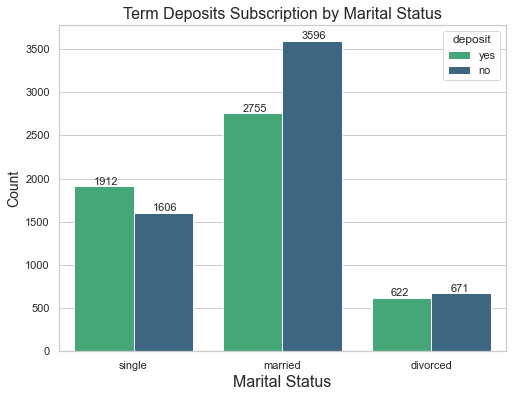

In [37]:
# Plot term deposits subscription by marital status
plt.figure(figsize = (8, 6))
ax = sns.countplot(x='marital', data=df, hue='deposit', palette='viridis_r',
        order=('single', 'married', 'divorced'))        
plt.xlabel('Marital Status', fontsize=16)
plt.ylabel('Count', size=14)
plt.title('Term Deposits Subscription by Marital Status', size=16)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.13
    ypos = fit.get_height()+18
    ax.annotate(pct, (xpos, ypos), fontsize = 11);

In [38]:
# Is there any pattern between marital and education regarding term deposits subscription? 
df.groupby(['marital', 'balance_group', 'deposit']).count()['age']

marital   balance_group    deposit
divorced  average balance  no          149
                           yes         193
          high balance     no           31
                           yes          47
          low balance      no          349
                           yes         290
          no balance       no          142
                           yes          92
married   average balance  no          914
                           yes        1038
          high balance     no          218
                           yes         241
          low balance      no         1850
                           yes        1216
          no balance       no          614
                           yes         260
single    average balance  no          400
                           yes         576
          high balance     no           81
                           yes         153
          low balance      no          921
                           yes        1033
          no balanc

Key takeaways:

1. People who are married are the most group that received term deposit subscription offers from telemarketers. The divorced group is in contrast.

2. Around 54% of single groups subscribed to a term deposit. Only this group has a higher subscriber ratio. Please look at the correlation between marital status and balance group; it is evident that single customers are subscribing to a term deposit even though they only have a low balance. Compared to the married and divorced groups that will subscribe if they have an average and high balance. A single person might have no dependent on taking care of. Thus, if they have excess money, they tend to save it in a term deposit account.

## Education

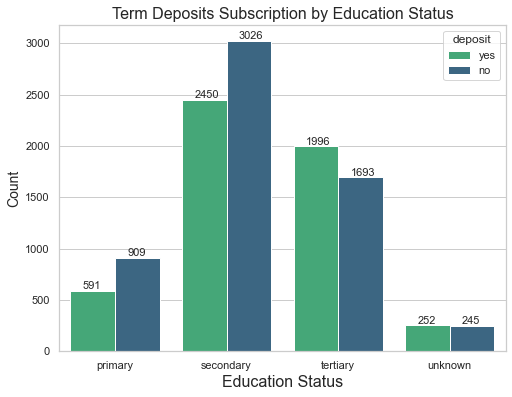

In [39]:
# Plot term deposits subscription by education status
plt.figure(figsize = (8, 6))
ax = sns.countplot(x='education', data=df, hue='deposit', palette='viridis_r',
        order=('primary', 'secondary', 'tertiary', 'unknown'))        
plt.xlabel('Education Status', fontsize=16)
plt.ylabel('Count', size=14)
plt.title('Term Deposits Subscription by Education Status', size=16)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x()+0.11
    ypos = fit.get_height()+18
    ax.annotate(pct, (xpos, ypos), fontsize = 11);

In [40]:
# Is there any pattern between education and balance group regarding term deposits subscription? 
df.groupby(['education', 'balance_group', 'deposit']).count()['age']

education  balance_group    deposit
primary    average balance  no          223
                            yes         203
           high balance     no           52
                            yes          56
           low balance      no          463
                            yes         272
           no balance       no          171
                            yes          60
secondary  average balance  no          725
                            yes         787
           high balance     no          139
                            yes         145
           low balance      no         1669
                            yes        1257
           no balance       no          493
                            yes         261
tertiary   average balance  no          459
                            yes         717
           high balance     no          125
                            yes         216
           low balance      no          849
                            yes         

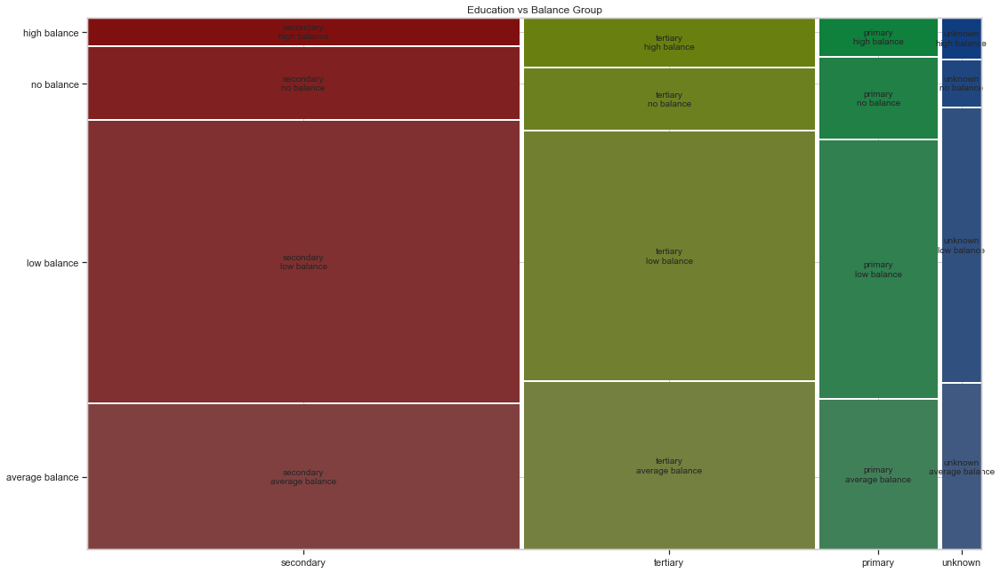

In [41]:
# Create a mosaic plot to see correlation between education and balance group
from statsmodels.graphics.mosaicplot import mosaic
 
education = df['education']
balance = df['balance_group']
data = pd.DataFrame({'Education': education, 'Balance Group': balance})

plt.rc('figure', figsize=(18, 11))
mosaic(data, ['Education', 'Balance Group'], title='Education vs Balance Group');

Key takeaways:

1. Tertiary and unknown education groups are the groups that have a higher term deposit subscribers ratio. In the tertiary group, potential customers who have low, average, and high balance tend to accept telemarketers' offers.

2. It is interesting to note that potential customers who hold secondary education background have low balance the most compared to the other groups. Also, many term deposit subscribers come from this kind of group.

## Housing & Loan

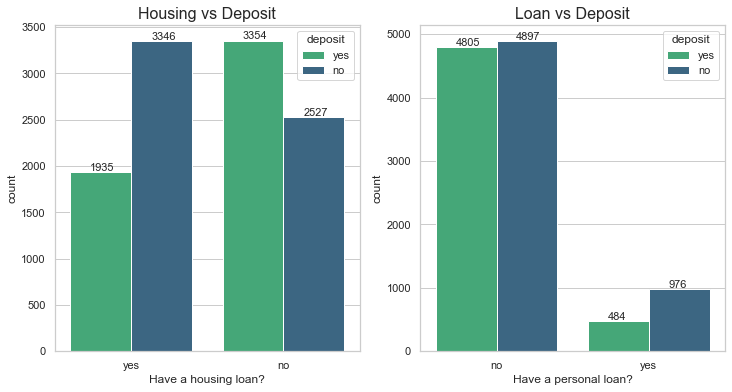

In [42]:
# Plot term deposits subscription by housing
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

ax1 = sns.countplot(ax=axes[0], x='housing', data=df, hue='deposit', palette='viridis_r')    
ax2 = sns.countplot(ax=axes[1], x='loan', data=df, hue='deposit', palette='viridis_r')     

# Set xlabels
ax1.set_xlabel('Have a housing loan?')
ax2.set_xlabel('Have a personal loan?')

# Set titles
ax1.set_title('Housing vs Deposit', size=16)
ax2.set_title('Loan vs Deposit', size=16)

for fit in ax1.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.13
    ypos = fit.get_height()+18
    ax1.annotate(pct, (xpos, ypos), fontsize = 11)
    
for fit in ax2.patches:
    pct2 = fit.get_height()
    xpos2 = fit.get_x() + 0.13
    ypos2 = fit.get_height()+18
    ax2.annotate(pct2, (xpos2, ypos2), fontsize = 11);

In [43]:
# Is there any pattern between housing, loan and balance group regarding term deposits subscription? 
print(df.groupby(['housing', 'balance_group', 'deposit']).count()['loan'])
print()
print(df.groupby(['loan', 'balance_group', 'deposit']).count()['housing'])

housing  balance_group    deposit
no       average balance  no          651
                          yes        1228
         high balance     no          164
                          yes         309
         low balance      no         1334
                          yes        1586
         no balance       no          378
                          yes         231
yes      average balance  no          812
                          yes         579
         high balance     no          166
                          yes         132
         low balance      no         1786
                          yes         953
         no balance       no          582
                          yes         271
Name: loan, dtype: int64

loan  balance_group    deposit
no    average balance  no         1271
                       yes        1703
      high balance     no          299
                       yes         424
      low balance      no         2589
                       yes        2285
   

In [44]:
# Balance group compared to housing and loan
print(df.groupby(['housing', 'balance_group']).count()['loan'])
print()
print(df.groupby(['loan', 'balance_group']).count()['housing'])

housing  balance_group  
no       average balance    1879
         high balance        473
         low balance        2920
         no balance          609
yes      average balance    1391
         high balance        298
         low balance        2739
         no balance          853
Name: loan, dtype: int64

loan  balance_group  
no    average balance    2974
      high balance        723
      low balance        4874
      no balance         1131
yes   average balance     296
      high balance         48
      low balance         785
      no balance          331
Name: housing, dtype: int64


Key takeaways:

1. Potential clients with a housing loan are more eager to refuse the offer to subscribe to a term deposit.

2. Loan does not really affect the customer's decision to subscribe to a term deposit.

3. There is no clear pattern between housing, loan, and balance. According to the data, many potential customers that have no or low balance, but at the same time do not have housing loan or personal loan.

## Contact

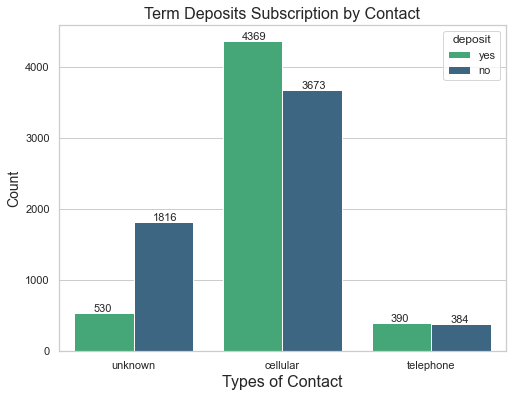

In [45]:
# Plot term deposits subscription by contact
plt.figure(figsize = (8, 6))
ax = sns.countplot(x='contact', data=df, hue='deposit', palette='viridis_r')        
plt.xlabel('Types of Contact', fontsize=16)
plt.ylabel('Count', size=14)
plt.title('Term Deposits Subscription by Contact', size=16)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.13
    ypos = fit.get_height()+18
    ax.annotate(pct, (xpos, ypos), fontsize = 11);

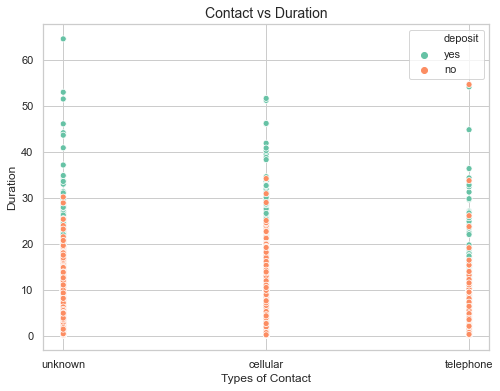

In [46]:
# Is there any relation between contact and duration regarding term deposits subscription?
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='contact', y='duration', hue='deposit')
plt.title('Contact vs Duration', size=14)
plt.xlabel('Types of Contact', size=12)
plt.ylabel('Duration', size=12);

Key takeaways:

1. Contact through cellular is the most effective way to get new term deposit subscribers. 82% of the subscribers come from this kind of contact.

2. It is seen from the plot of contact against duration that the longer the call duration, the more likely potential customers will accept the offer to subscribe to a term deposit. This condition applies to all the kind of contact methods.

## Duration

In order to find a pattern in duration feature, it is interesting to group the range of duration values into several groups:

1. 10: In the range between 0-10
2. 20: In the range between 11-20
3. 30: In the range between 21-30
4. 40: In the range between 31-40
5. 50: In the range between 41-50
6. 60: In the range between 51-65

In [47]:
# Create duration_group column to categorize the range of duration
duration_list = [df]

for duration in duration_list:
    duration.loc[duration['duration'] <= 10,  'duration_group'] = 10
    duration.loc[(duration['duration'] > 10) & (duration['duration'] <= 20), 'duration_group'] = 20
    duration.loc[(duration['duration'] > 20) & (duration['duration'] <= 30), 'duration_group'] = 30
    duration.loc[(duration['duration'] > 30) & (duration['duration'] <= 40), 'duration_group'] = 40
    duration.loc[(duration['duration'] > 40) & (duration['duration'] <= 50), 'duration_group'] = 50
    duration.loc[(duration['duration'] > 50) & (duration['duration'] < 65), 'duration_group'] = 60

In [48]:
# Change duration_group type from float 64 to int64
df['duration_group'] = df['duration_group'].astype(np.int64)

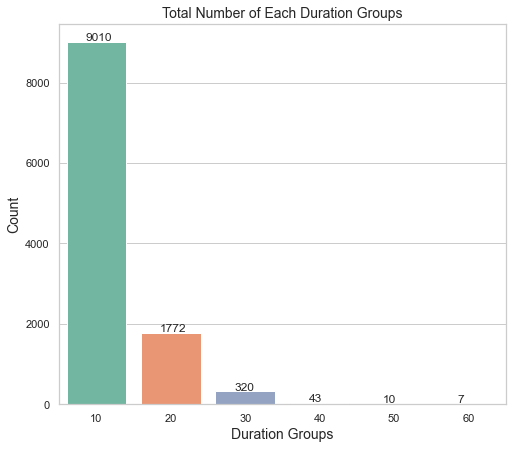

In [49]:
# Plot total number of each duration group in descending order
plt.figure(figsize=(8, 7))
ax = sns.countplot(df['duration_group'], order = df['duration_group'].value_counts().index, palette='Set2')
plt.title('Total Number of Each Duration Groups', fontsize=14)
plt.xlabel('Duration Groups', size=14)
plt.ylabel('Count', size=14)

for p, label in zip(ax.patches, df['duration_group'].value_counts()):
    ax.annotate(label, (p.get_x()+0.25, p.get_height()+25));

In [50]:
# Percentage of each duration group to subscribe to a term deposit
pd.crosstab(df['deposit'], df['duration_group']).apply(lambda x: x/x.sum()*100)

duration_group,10,20,30,40,50,60
deposit,,,,,,
no,61.642619,16.083521,9.0625,9.302326,0.0,14.285714
yes,38.357381,83.916479,90.9375,90.697674,100.0,85.714286


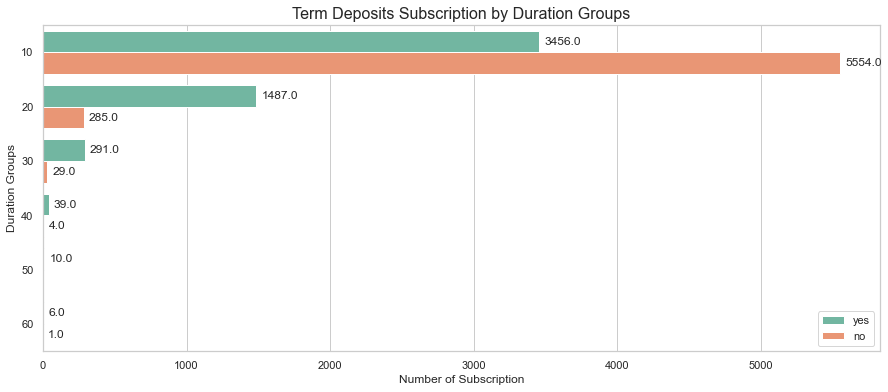

In [51]:
# Create a plot for deposits subscription by duration group
plt.figure(figsize=(15, 6))
ax = sns.countplot(y='duration_group', data=df, hue='deposit', palette='Set2') 
plt.title('Term Deposits Subscription by Duration Groups', fontsize=16)
plt.ylabel('Duration Groups', fontsize=12)
plt.xlabel('Number of Subscription', fontsize=12)
plt.legend(loc='lower right')

for i in ax.patches:
    ax.annotate(i.get_width(), xy=(i.get_width(), i.get_y()+i.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha='left', va='center');

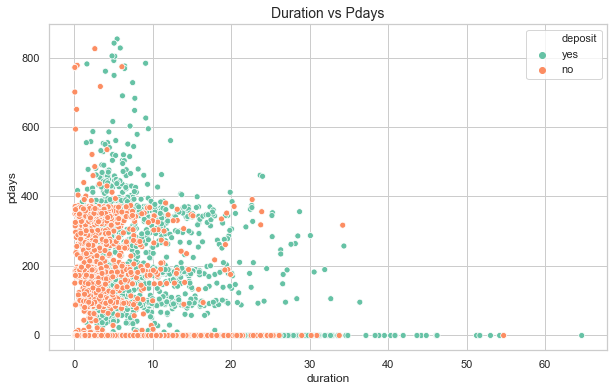

In [52]:
# Plot duration vs pdays
plt.figure(figsize=(10, 6))
sns.scatterplot(x='duration', y='pdays', hue='deposit', data=df)
plt.title('Duration vs Pdays', size=14);

Key takeaways:

1. Around 80% of the call or talk duration is less than 10 minutes, and only 38% of the '10' duration group subscribed to a term deposit of this bank.

2. It is clear that if the duration is longer, potential customers more likely accept the offer to subscribe to a term deposit. It seems that a duration between 10 and 20 minutes is the most suitable for the potential customers.

3. Most of the potential customers who refuse the offer are in the interval of pdays < 400 with duration < 10 minutes. It is interesting to note that many clients who were contacted more than 400 days ago from the previous campaign accepted the offer to subscribe to a term deposit with only less than 10 minutes of talk duration.

## Campaign & Duration

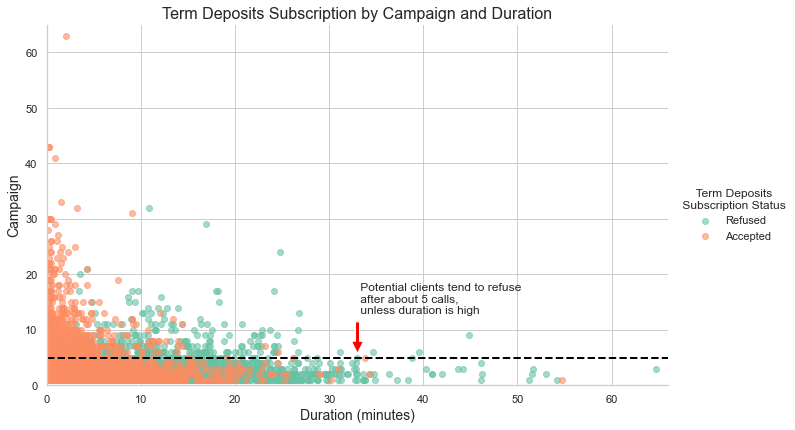

In [53]:
# Plotting term deposits subscription by campaign and duration
plotting = sns.lmplot(x='duration', y='campaign', data=df, hue='deposit', palette='Set2', fit_reg=False, scatter_kws={'alpha':0.6}) 

plotting.fig.set_size_inches(12, 6)

# Legend Title
title = '     Term Deposits \n Subscription Status'
plotting._legend.set_title(title)

# Replace legend labels
new_labels = ['Refused', 'Accepted']
for i, j in zip(plotting._legend.texts, new_labels): i.set_text(j)

plt.axis([0, 66, 0, 65])
plt.axhline(y=5, linewidth=2, color='black', linestyle='--')
plt.annotate(' Potential clients tend to refuse \n after about 5 calls, \n unless duration is high', xy=(33, 5), xytext=(33, 13), arrowprops=dict(facecolor='red', shrink=0.1))
plt.xlabel('Duration (minutes)', fontsize=14)
plt.ylabel('Campaign', fontsize=14)
plt.title('Term Deposits Subscription by Campaign and Duration', size=16);

In [54]:
# It is important to check the actual value from each campaign and its relation to term deposit subscription.
campaign_rate = pd.crosstab(df['deposit'], df['campaign']).apply(lambda x: x/x.sum()*100)
campaign_rate.T 

deposit,no,yes
campaign,,
1,46.623593,53.376407
2,53.731836,46.268164
3,53.217260,46.782740
4,58.884565,41.115435
5,63.227513,36.772487
6,65.283019,34.716981
7,66.187050,33.812950
8,75.000000,25.000000
9,70.833333,29.166667


Key takeaways:

1. The more the calls to potential clients within the same marketing campaign, the more likely potential clients will refuse to open term deposits with the bank.

2. When potential customers were called more than five times, they tend to refuse the offer unless the call duration is high.

3. After the third call, the probability that a potential client will refuse to subscribe to a term deposit increases drastically by approximately 5%. Thus, three calls can be a threshold for telemarketers to approach one potential customer. As the number of calls reaches the threshold, the telemarketers may evaluate whether the customer is still interested or not.

4. The more calls the telemarketer makes to a potential client in a shorter period of time, the more irritated the potential client will be. Thus, it leads to a higher level of probability for the potential client to refuse the offer.

## Month

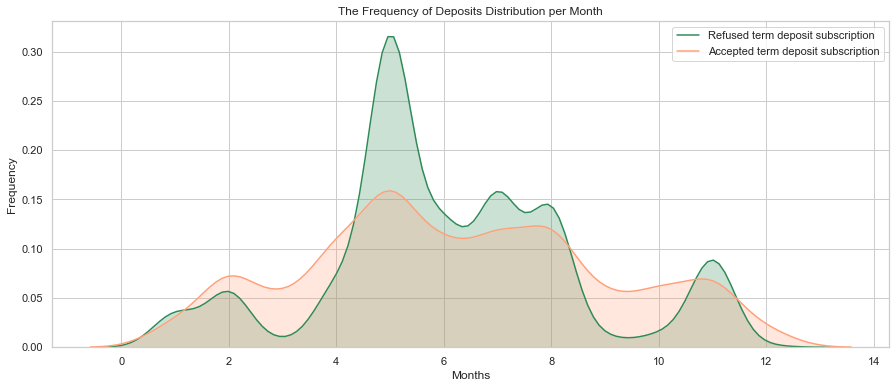

In [55]:
# Plot of deposits distribution per month
plt.figure(figsize=(15, 6))
ax=sns.kdeplot(df.loc[(df['deposit_num'] == 0), 'month_num'] , color='seagreen', shade=True, label='Refused term deposit subscription')
ax=sns.kdeplot(df.loc[(df['deposit_num'] == 1), 'month_num'] , color='lightsalmon', shade=True, label='Accepted term deposit subscription')
ax.set(xlabel='Months', ylabel='Frequency')
plt.title('The Frequency of Deposits Distribution per Month');

In [56]:
# Check the percentage of marketing activity in each month
df['month_num'].value_counts()/df.shape[0]*100

5     25.300125
8     13.608672
7     13.563877
6     10.947859
11     8.448307
4      8.269127
2      6.952159
10     3.511915
1      3.081885
9      2.857911
3      2.472675
12     0.985486
Name: month_num, dtype: float64

In [57]:
# The number of last contact in each month
df['month_num'].value_counts()

5     2824
8     1519
7     1514
6     1222
11     943
4      923
2      776
10     392
1      344
9      319
3      276
12     110
Name: month_num, dtype: int64

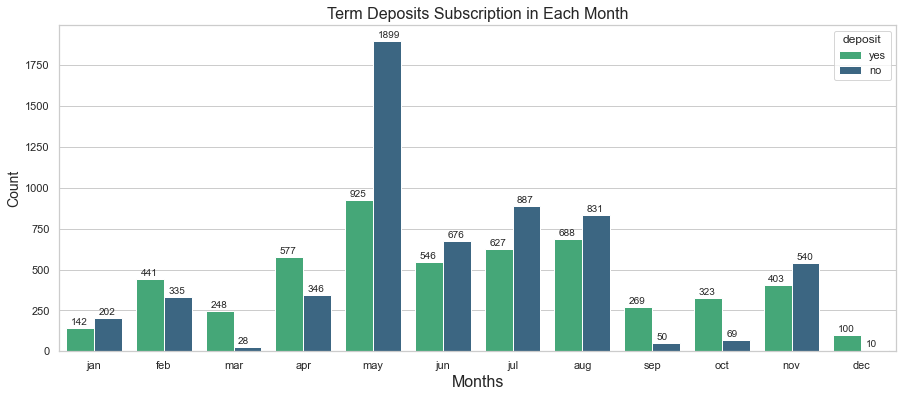

In [58]:
# Breakdown the total number of each month regarding term deposits subscription
plt.figure(figsize = (15, 6))
ax = sns.countplot(x='month', data = df, order=('jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'), hue='deposit', palette='viridis_r')        
plt.xlabel('Months', fontsize = 16)
plt.ylabel('Count', size=14)
plt.title('Term Deposits Subscription in Each Month', size=16)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.065
    ypos = fit.get_height()+19
    ax.annotate(pct, (xpos, ypos), fontsize = 10);

In [59]:
# The total number of the first to third call in each of the months
print(df[df['campaign'] == 1].groupby(['month_num'])['campaign'].count().to_frame())
print(df[df['campaign'] == 2].groupby(['month_num'])['campaign'].count().to_frame())
print(df[df['campaign'] == 3].groupby(['month_num'])['campaign'].count().to_frame())

           campaign
month_num          
1               187
2               376
3               143
4               497
5              1262
6               486
7               473
8               368
9               188
10              259
11              514
12               45
           campaign
month_num          
1               103
2               204
3                77
4               244
5               767
6               310
7               402
8               468
9                78
10               85
11              257
12               33
           campaign
month_num          
1                32
2                81
3                24
4                99
5               367
6               162
7               208
8               170
9                34
10               36
11               87
12               21


In [60]:
# Check marketing effectivity ratio per month by applying simple formula
total_client_per_month = df['month_num'].value_counts()
accepted = df[df['deposit'] == 'yes'].groupby(['month_num'])['deposit'].count()
rejected = df[df['deposit'] == 'no'].groupby(['month_num'])['deposit'].count()

# Show marketing effectivity ratio
marketing_ratio = (accepted-rejected)/total_client_per_month*100
marketing_ratio

1    -17.441860
2     13.659794
3     79.710145
4     25.027086
5    -34.490085
6    -10.638298
7    -17.173052
8     -9.414088
9     68.652038
10    64.795918
11   -14.528102
12    81.818182
dtype: float64

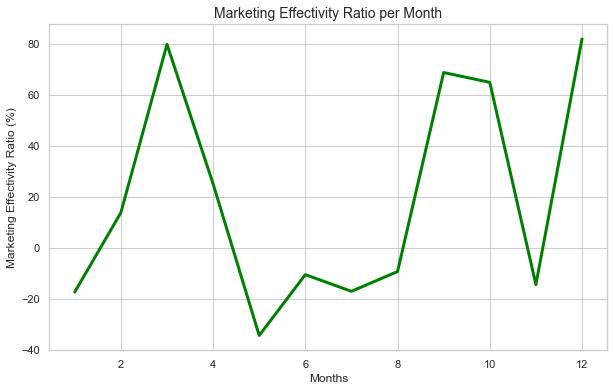

In [61]:
# Plotting of the marketing effectivity ratio per month
plt.figure(figsize=(10, 6))
marketing_ratio.plot(color='g', linewidth=3)
plt.xlabel('Months')
plt.ylabel('Marketing Effectivity Ratio (%)')
plt.title('Marketing Effectivity Ratio per Month', size=14);

Key takeaways from the month feature regarding the term deposit subscription:

It is a bit tricky to interpret this feature since, in the description, it says that this feature holds the last contact month of the year. Based on data, it is known that most of the potential customers received the call from the telemarketer for the first time. Accordingly, the number of calls performed by telemarketer tend to decrease in the second, third, and subsequent attempts. This might be because some potential customers told the telemarketer that they do not have any interest in subscribing to term deposits. 

Thus, without considering the total number of contacts that have been performed for the particular potential customer, it can be concluded that:

1. May was the month of highest marketing activity (25.3%), while December was the lowest marketing activity (0.985%).

2. Event though May was the month with the highest level of marketing activity, however, it had the lowest ratio (negative), meaning there were more rejected than accepted requests for term deposits subscription.

3. On the other hand, the top four highest marketing effectiveness ratios (positive) were achieved in March (79.71%), September (68.65%), October (64.79%), and December (81.81%). Nevertheless, these months' marketing activities were much lower than the other months (except January).

## Seasonality

Since the data come from a bank in Portugal, it may be interesting to group the months into seasons (spring, summer, autumn, winter). Though the result will not be different from the month feature, this seasonality grouping brings the outcome interpretation to become much simpler than the month feature. That being said, it will give an insight into which season the bank should focus on its marketing activity.

In [62]:
# Create a season column
df['season'] = np.nan
season_list = [df]

# Define conditions for each seasons
for season in season_list:
    season.loc[(season['month_num'] >= 3) & (season['month_num'] <= 5), 'season'] = 'spring'
    season.loc[(season['month_num'] >= 6) & (season['month_num'] <= 8), 'season'] = 'summer'
    season.loc[(season['month_num'] >= 9) & (season['month_num'] <= 11), 'season'] = 'autumn'
    season.loc[season['month_num'] <= 2, 'season'] = 'winter'
    season.loc[season['month_num'] == 12, 'season'] = 'winter'
    
df['season'].value_counts()

summer    4255
spring    4023
autumn    1654
winter    1230
Name: season, dtype: int64

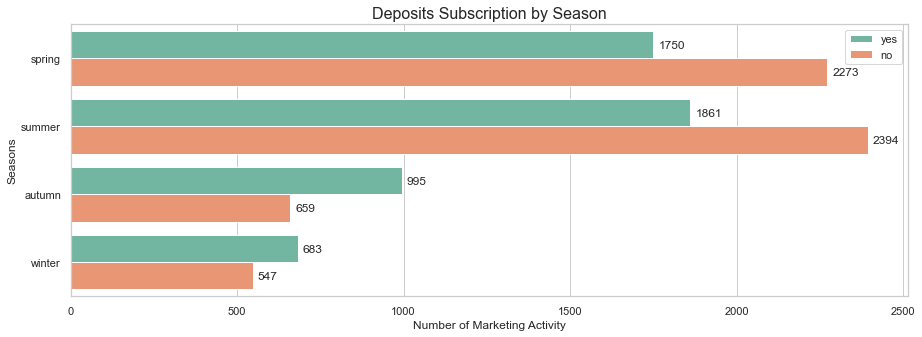

In [63]:
# Create a plot for deposits subscription by season
plt.figure(figsize=(15, 5))
ax = sns.countplot(y='season', data=df, hue='deposit', palette='Set2') 
plt.title('Deposits Subscription by Season', fontsize=16)
plt.ylabel('Seasons', fontsize=12)
plt.xlabel('Number of Marketing Activity', fontsize=12)
plt.legend()

for i in ax.patches:
    ax.annotate(i.get_width(), xy=(i.get_width(), i.get_y()+i.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha='left', va='center');

Key takeaways from seasonality grouping:

1. More customers have a deal on subscribing to term deposits during the season autumn and winter.

2. With regards to the number of marketing activities, a high number of activities was achieved during spring and summer. However, the potential customers who refused to subscribe to the term deposits are higher than those who accepted.

3. From the two points above, it is wise to say that the marketing team should increase their activity during autumn and winter since more potential customers tend to subscribe during these seasons.

## Pdays & Previous

'pdays' and 'previous' features are highly correlated. 'pdays' holds the number of days passed by after the client was last contacted from a previous campaign, whereas 'previous' represents the number of contacts performed before this campaign and for each client in this dataset.  

The attribute information says that 'pdays' value 999 means that the potential customer was not previously contacted. However, in the dataset itself, there is no 999 value. Instead, it has a lot of -1 values (8324). Therefore, according to this finding, I decided to assume that the -1 value is equal to the 999 value. That means telemarketers have never contacted 8324 potential customers in the dataset. To check the impact of the -1 values on the statistical data, it is better to visualize it in a violin plot.

In [64]:
# Check the total amount of -1 values in 'pdays' feature
df[df['pdays'] == -1].count()['pdays']

8324

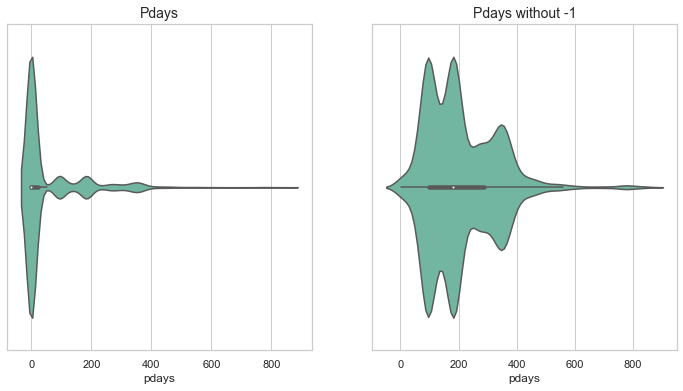

In [65]:
# Plot pdays
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  

ax1 = sns.violinplot(ax=axes[0], x='pdays', data=df)
ax2 = sns.violinplot(ax=axes[1], x='pdays', data = df[df.pdays != -1])

ax1.set_title('Pdays', size=14)
ax2.set_title('Pdays without -1', size=14);

In [66]:
# Compare mean, median, mode

# pdays
print('Pdays original \n')
print('Mean:', df.pdays.mean())
print('Median:', df.pdays.median())
print('Mode:', df.pdays.mode())
print()

# pdays without -1
without_minus = df[df.pdays != -1]

print('Pdays without -1 \n')
print('Mean:', without_minus.pdays.mean())
print('Median:', without_minus.pdays.median())
print('Mode:', without_minus.pdays.mode())

Pdays original 

Mean: 51.33040673714388
Median: -1.0
Mode: 0   -1
dtype: int64

Pdays without -1 

Mean: 204.8181818181818
Median: 182.0
Mode: 0    92
dtype: int64


In a violin plot, the median value is denoted by a white dot on the center of the violin plot, while the Interquartile range is represented by the black bar in the center of the violin.

The lower/upper adjacent values (the black lines stretched from the bar) are defined as the first quartile — 1.5 IQR and third quartile + 1.5 IQR, respectively. These values can be considered as outliers as it is lying outside of these fences. In addition, wider sections of the violin plot represent a higher probability of observations taking a given value. On the other hand, the thinner sections correspond to a lower probability.

As the -1 value is dropped, the mean, median, and mode are significantly changed. It also can be seen in the 'pdays' violin plots that the shape of the plots is also changed, including the number of outliers. However, considering this feature has a weak positive correlation (in fact, it is better than some other features) and the amount of -1 takes 74.5% of the population, thus the outliers handling in data preprocessing section must be done carefully.

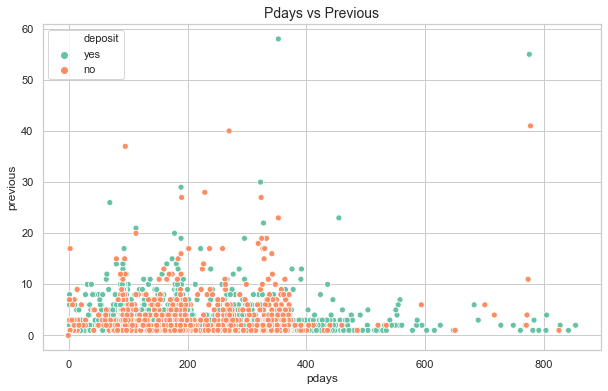

In [67]:
# Plot pdays and previous against deposit
plt.figure(figsize=(10, 6))
sns.scatterplot(x='pdays', y='previous', hue='deposit', data=df)
plt.title('Pdays vs Previous', size=14);

In [68]:
# Check the first 5 pdays amount distribution grouped by previous and deposit features
df.groupby(['previous', 'deposit']).count()['pdays'].head(10)

previous  deposit
0         no         4940
          yes        3384
1         no          304
          yes         583
2         no          237
          yes         456
3         no          141
          yes         294
4         no           73
          yes         171
Name: pdays, dtype: int64

Key takeaways:

1. 'pdays' and 'previous' features have a positive correlation (21% and 23% respectively) with deposit. It means that if the value of pdays or previous increases, the chance of potential customers will subscribe to a term deposit is higher.

2. The amount of -1 value (8324) in the 'pdays' feature is in accordance with the total number of potential customers who are not previously contacted ('previous' feature).

3. If a potential customer has received < 10 calls in previous campaigns and the last day he/she was contacted is more than 400 days, the likelihood that this customer will subscribe is also higher.

## Poutcome

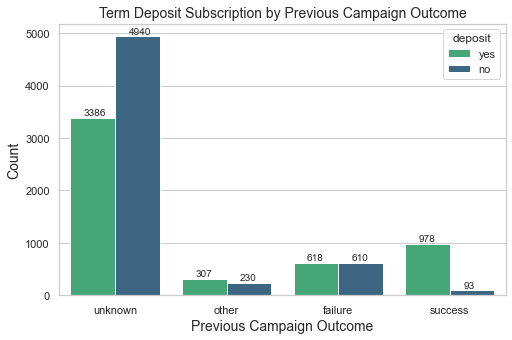

In [69]:
# Plot previous campaign outcome against a term deposit subscription
plt.figure(figsize = (8, 5))
ax = sns.countplot(x='poutcome', data = df, hue='deposit', palette='viridis_r')        
plt.xlabel('Previous Campaign Outcome', fontsize = 14)
plt.ylabel('Count', size=14)
plt.title('Term Deposit Subscription by Previous Campaign Outcome', size=14)

for fit in ax.patches:
    pct = fit.get_height()
    xpos = fit.get_x() + 0.12
    ypos = fit.get_height()+50
    ax.annotate(pct, (xpos, ypos), fontsize = 10);

In [70]:
# Check the number of accepted and refused to subscribe grouped by poutcome and balance group 
df.groupby(['poutcome', 'balance_group', 'deposit']).count()['balance']

poutcome  balance_group    deposit
failure   average balance  no          164
                           yes         223
          high balance     no           37
                           yes          57
          low balance      no          334
                           yes         279
          no balance       no           75
                           yes          59
other     average balance  no           59
                           yes         127
          high balance     no           12
                           yes          28
          low balance      no          129
                           yes         126
          no balance       no           30
                           yes          26
success   average balance  no           33
                           yes         351
          high balance     no            8
                           yes          89
          low balance      no           48
                           yes         490
          no balanc

Key takeaways:

1. The total number of unknowns is 8326. It is only 2 numbers away from the potential customers who have never been contacted. It means the unknown result is most likely comes from this kind of customer.

2. The chance of the current campaign being successful will beg getting higher, if the previous campaign was also successful for a particular potential client.

3. In the previous campaign, the successful marketing campaign has no relation to the client's balance condition. 

### 3.4.3 EDA Conclusion

According to EDA, it can be concluded that to get more term deposit subscribers and make the marketing campaign more efficient, for the next marketing campaign, the marketing team of Portuguese bank should have considering the following key points:

1. Age category: Should aim for the potential customers in their 20s or younger and 60s or older. 

2. Job type: Students and retired person.

3. Balance: Potential customers who have an average and high balance.

4. Marital: Marital status is not really significant affecting the potential customers' decision, but the marketing team should focus more on customers whose single.  

5. Education: Similar to marital status, education background plays an unimportant role in customer's decision-making. However, the potential customers with tertiary education backgrounds tend to be more interested in subscribing to a term deposit.

6. Months of marketing activity: It will be wise for the marketing team to focus the marketing campaign during March, September, October, and December. However, December should be under consideration because it was the month with the lowest marketing activity. It could be because there are many days off in December (welcoming Christmas and new year).

7. Seasonality: The next marketing campaign should focus more on the autumn and winter seasons.

8. Housing: Should aim at potential customers who do not have a housing loan.

9. Campaign call & duration: No more than 3 calls should be applied to the same potential client to save time and effort in getting new term deposit subscribers. In addition, the duration of the call has the most positive correlation with the customer's decision to subscribe to a term deposit. Just keep in mind that a longer call duration increases the chance of getting new term deposit subscribers. Therefore, gaining the level of engagement with the potential customers will lead to an increase in the probability of getting a successful campaign and increasing marketing campaign effectiveness. 

10. Contact: Telemarketers should contact potential customers through their mobile.

11. Poutcome: It is better to give more approach to the potential customers who made a deal in the previous campaign.


By combining all the targeted marketing strategies, the next marketing campaign of the bank will be more effective than the current one. Ultimately, increasing marketing effectiveness and gaining capital requirement by getting more term deposit subscribers will be more feasible to achieve.

## 4. References

1. https://www.kaggle.com/janiobachmann/bank-marketing-dataset
2. Moro et al. (2014) - A data-driven approach to predict the success of bank telemarketing
3. https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.normaltest.html
4. https://www.researchgate.net/publication/323336704_Analysis_of_Student_Satisfaction_Toward_Quality_of_Service_Facility/figures?lo=1
5. https://www.statsmodels.org/stable/generated/statsmodels.graphics.mosaicplot.mosaic.html